<a href="https://colab.research.google.com/github/benjaminbeilharz/annotated-transformer/blob/main/ViT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install requests pillow plotly matplotlib numpy torch

In [2]:
from functools import partial
from typing import Callable, Optional, Iterable

import numpy as np
import torch

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# we need this to load some images later
import requests
from PIL import Image
from io import BytesIO

# What is a Transformer?

- it is a more recent form of architecture which started to deal with textual data, while it is also sets ground in other domains as computer vision
- it is an architecture which contains multiple stacks of `Encoders` and `Decoders` (if modeling a seq2seq problem), i.e. they take a sequence and produce another sequence.

![link text](https://jalammar.github.io/images/t/The_transformer_encoder_decoder_stack.png)

<!-- ## Encoder

The `Encoder` is a module which can be stacked $n$ times in a `Transformer`.

It contains the following operations:
- `Self-Attention (multihead-attention)`
- `residual connections`
- `layer normalization` -->

### Attention – The operation which makes Transformers work so well.

In short and intuition-wise, Attention enables the underlying model to focus on another word in the input sequence which is closely related to the word being currently looked at.

![](https://miro.medium.com/max/700/1*pT0ZIWeoilLkz3e_1fVeYQ.png)

In the above example you can see two different sentences:
1. The cat drank the milk because it was hungry.
2. The cat drank the milk because it was sweet.

We see how `(self-)attention` helps us to look at sentence in a clearer way. It learns to properly resolve the coreference *it* to the anaphora cat and the milk respectively.

### Attention Hyperparameters
Since the operation in itself is just a mixture of affine linear layers and `softmax` and some crazy reshaping and permutations, we also have some possibilities to choose hyperparameters. Commonly, we have to configure:
- `embedding size/model size` which is the width of the vector being carried through the `Transformer`
- `query/key size` is often interchangably used and is the size of the weights being used for the linear layers to produce the **Query**, **Key** and **Value** matrices.
- `number of attention heads`

#### Attention
We use `Attention` in the `Transformer` in three not so different ways:
![](https://miro.medium.com/max/970/1*47UCxMjpfJ2yo48fctNv-g.png)
- `encoder self-attention`, where the input sequence pays attention to itself
- `decoder self-attention`, where the target sequence pays attention to itself
- `encoder-decoder attention` - where the target sequence pays attention to the encoded sequence and the current target token

#### But... what exactly is attention now?

For simplicity lets imagine an embedding input of shape `(sequence length, embedding size)`.

![](https://miro.medium.com/max/2000/1*NR9x97HungXtL6Vx0CGmow.png)



In [3]:
sequence_length = 15
embedding_size = 128
embedding_input = np.random.randint(4, size=(sequence_length,embedding_size))

Attention consists of three separated linear layers for each of the `Query`, `Key` and `Value`, such that we need `weights` for each of the linearities.

## Positional Encoding

Since we model entire sequences in the `Transformer` and do not compute seperate time-steps for each input token, we have to create a sense of order which is done with the help of the trigonometric functions as `sine` and `cosine`. Belows example is a visualized way to understand how the `positional embedding` works.

In [4]:
def positional_encoding(x: np.ndarray, embedding_size: int) -> list[np.ndarray, np.ndarray]:
    """Uses sine and cosine and remodel sequence order, which is added to the sequence embedding.

    Args:
        x: input embedding
        embedding_size: dimension of embedding

    Returns:
        Embedding with positional encoding
        Positional Encoding
    """
    def get_angles(pos, i, embedding_size):
        angles = 1 / np.power(10000., (2*(i//2)) / embedding_size)
        return pos*angles

    seq_length = x.shape[0] if len(x.shape) <= 2 else x.shape[1]
    angles = get_angles(np.arange(seq_length)[:, np.newaxis],
                        np.arange(embedding_size)[np.newaxis, :],
                        embedding_size)

    angles[:, 0::2] = np.sin(angles[:, 0::2])
    angles[:, 1::2] = np.cos(angles[:, 1::2])
    pos_encoding = angles if len(x.shape) > 1 else angles[np.newaxis,...]
    return x + pos_encoding, pos_encoding

In [5]:
# how the positional encoding behaves in larger sequences
t_sequence_length = 128
t_embedding_size = 128
t_embedding_input = np.random.randint(4, size=(t_sequence_length,t_embedding_size))
t_pos_emb, pos_enc = positional_encoding(t_embedding_input, t_embedding_size)
px.imshow(pos_enc)

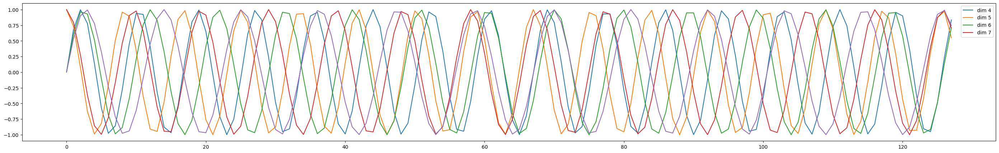

In [6]:
# wave form plot given the sequence (x axis = sequence length, y axis = positional embedding)
plt.figure(figsize=(35, 5))
plt.plot(np.arange(128), pos_enc[:, 4:9])
plt.legend([f'dim {p}' for p in [4,5,6,7]])
plt.show()

In [7]:
def linear_layer(x: np.ndarray, output_size: int, activation: Callable = None) -> np.ndarray:
    """Implements the most basic fully connected feed forward layer.

    Args:
        x: Input vector/tensor
        output_size: The number of dimensions the layer should broadcast or downsample to
        activation: Any activation function

    Returns:
        (Activated) linear transformation
    """
    weights = np.random.randint(2, size=(x.shape[-1], output_size))
    assert x.shape[-1] == weights.shape[0], f'Dimensionalities do not match input size: {x.shape} and weights size: {weights.shape}'
    bias = np.random.randint(2, size=(output_size))
    out = np.matmul(x, weights) * 0.01 # scaling
    out += np.broadcast_to(bias, out.shape)
    return activation(out) if activation is not None else out

def softmax(x: np.ndarray, axis: int) -> np.ndarray:
    """Numerical unstable softmax"""
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=axis)

def attention(Q: np.ndarray, K: np.ndarray, V: np.ndarray) -> np.ndarray:
    """Calculates attention score for one head
    Args:
        Q, K, V: Matrices with equal shape

    Returns:
        Attention matrix
    """
    logits = np.matmul(Q, K.T) / np.sqrt(K.shape[1])
    softmax_out = softmax(logits, axis=0)  # across rows
    return np.matmul(softmax_out, V), softmax_out, logits

After retrieving the matrices of `Query`, `Key` and `Value`, we can now start to compute the `attention score`.

![](https://jalammar.github.io/images/t/self-attention-matrix-calculation-2.png)

In [8]:
# create example positional inputs and Q matrices
x, _ = positional_encoding(embedding_input, embedding_size)  # 15 x 128
Q = linear_layer(x, embedding_size)  # 15 x 128
K = linear_layer(x, embedding_size)  # 15 x 128
V = linear_layer(x, embedding_size)  # 15 x 128

In [9]:
fig = make_subplots(rows=1, cols=3, subplot_titles=('Q-Matrix', 'K-Matrix', 'V-Matrix'),
                    shared_yaxes=True, shared_xaxes=True)

fig.add_trace(
    go.Heatmap(z=Q, coloraxis='coloraxis'),
    row=1, col=1
)

fig.add_trace(
    go.Heatmap(z=K, coloraxis='coloraxis'),
    row=1, col=2
)

fig.add_trace(
    go.Heatmap(z=V, coloraxis='coloraxis'),
    row=1, col=3
)

fig.update_layout(showlegend=False)

fig.show()

In [10]:
attention_matrix, activation_values, logits = attention(Q, K, V)

In [11]:
fig = make_subplots(rows=1, cols=3, subplot_titles=('Logits', 'Activation values', 'Attention Matrix'))

fig.add_trace(
    go.Heatmap(z=logits),
    row=1, col=1
)

fig.add_trace(
    go.Heatmap(z=activation_values),
    row=1, col=2
)

fig.add_trace(
    go.Heatmap(z=attention_matrix),
    row=1, col=3
)

fig.update_layout(showlegend=False)

fig.show()

### Let's talk multihead attention
Earlier we have discussed that there are some hyperparameters exclusively `multihead attention`:
- `number of attention heads`
- and `query or key size`, which is in the end just the `embedding dimension` of the input sequence  
which will help construct our `multihead attention`.

`Multihead Attention` expands the model's ability yo focus on different positions. It also gives the `attention` layer more *representation possibilities* than just using one `attention` head.

For the new matrices we follow the intuition of this image:
![](https://miro.medium.com/max/960/1*_2mb_TfvIMsZoIFILNq0CA.png)

In [12]:
# define multihead attention hyperparameters
number_of_heads = 8
query_size = embedding_size = 1024

In [13]:
def multihead_linear_layer(x: np.ndarray, nheads: int, embedding_size: int) -> np.ndarray:
    """Alternative way to calculate all attention heads matrices as one big matrix multiplication

    Args:
        x - input sequence
        nheads - number of attention heads
        embedding_size - embedding dimension from input sequence

    Returns:
        Query/Key/Value matrix of size (sequence_length x n_heads*embedding_size)
    """
    weights = np.random.randint(2, size=(x.shape[-1], nheads*embedding_size))
    assert x.shape[-1] == weights.shape[0], f'Dimensionalities do not match input: {x.shape} and weights {weights.shape}'
    bias = np.random.randint(2, size=(weights.shape[-1]))
    out = np.matmul(x, weights) * 0.25 # scaling
    out += np.broadcast_to(bias, out.shape)
    return out.reshape(x.shape[0], nheads*embedding_size)

In [14]:
Qs = multihead_linear_layer(x, number_of_heads, query_size)
Ks = multihead_linear_layer(x, number_of_heads, query_size)
Vs = multihead_linear_layer(x, number_of_heads, query_size)

In [15]:
fig = make_subplots(rows=1, cols=3, subplot_titles=('Q-Matrix', 'K-Matrix', 'V-Matrix'),
                    shared_yaxes=True, shared_xaxes=True)

fig.add_trace(
    go.Heatmap(z=Qs.reshape(sequence_length, -1), coloraxis='coloraxis'),
    row=1, col=1
)

fig.add_trace(
    go.Heatmap(z=Ks.reshape(sequence_length, -1), coloraxis='coloraxis'),
    row=1, col=2
)

fig.add_trace(
    go.Heatmap(z=Vs.reshape(sequence_length, -1), coloraxis='coloraxis'),
    row=1, col=3
)

fig.update_layout(showlegend=False)

fig.show()

In [16]:
Qs = {i: linear_layer(x, embedding_size) for i in range(number_of_heads)}
Ks = {i: linear_layer(x, embedding_size) for i in range(number_of_heads)}
Vs = {i: linear_layer(x, embedding_size) for i in range(number_of_heads)}

In [17]:
from scipy.special import softmax  # using softmax with numerical stability
def multihead_attention(Q: dict, K: dict, V: dict) -> list[np.ndarray, np.ndarray]:
    """Multihead attention

    Args:
        Q/K/V matrices of shape (sequence_length, embedding_size)

    Returns:
        Return attention score matrix with shape (sequence_length, number_of_heads * embedding_size)
    """
    def permute(x: np.ndarray) -> tuple:
        """Swap axes from number_of_heads <-> sequence_length

        Args:
            x: matrix from shape (batch_size) x number_of_heads x sequence_length x embedding_size // number_of_heads
        """
        if len(x.shape) > 3:
            batch, heads, sequence_length, embeddings_size = x.shape
            return (batch, sequence_length, heads, embeddings_size)
        else:
            heads, sequence_length, embedding_size = x.shape
            return (sequence_length, heads, embedding_size)

    attention_matrix = []
    for i in Q.keys():
        logits = np.matmul(Q[i], K[i].T) / np.sqrt(K[i].shape[1]) # sequence length x embedding size
        softmax_out = softmax(logits, axis=-1)  # softmax across rows
        attention_matrix.append(np.matmul(softmax_out, V[i]))

    attention_matrix = np.array(attention_matrix)  # number of heads x sequence length x embedding size
    attention_heads = attention_matrix.reshape(permute(attention_matrix))  # sequence length x number of heads x embedding size
    attention = attention_heads.reshape(attention_heads.shape[0], -1)  # sequence length x number of heads * embedding size

    attention_score_weights = np.random.randint(3, size=(attention.shape[-1], attention_matrix.shape[-1]))  # number of heads * embedding size x embedding size
    attention_score = np.matmul(attention, attention_score_weights) # 15

    return attention_score, attention_heads

In [18]:
attention_scores, attention_heads = multihead_attention(Qs, Ks, Vs)

In [19]:
fig = make_subplots(rows=2, cols=4, shared_xaxes=False, shared_yaxes=False,
                    subplot_titles=[f'Head {i}' for i in range(1, 9)])
rows = [1,1,1,1,2,2,2,2]
cols = [1,2,3,4,1,2,3,4]
for i in range(attention_heads.shape[1]):
    fig.add_trace(
        go.Heatmap(z=attention_heads[:,i,:], coloraxis='coloraxis'),
        col=cols[i], row=rows[i]
    )

fig.show()

In [20]:
px.imshow(attention_scores)

![](https://jalammar.github.io/images/t/transformer_multi-headed_self-attention-recap.png)

## Layer Normalization

Why do we use a `Layer Normalization`? Let's outline limitations of `Batch Normalization`:
- we need to keep track of a running average
- in `RNN`s is barely possible to do the same normalization for each time-step
- does not work with small batch sizes, since larger LM are trained with a small batch size, this elimniates the case for language models
- in distributed computing, $\mu$ and $\sigma$ need to be passed across devices

We can see `Layer Normalization` as a simpler normalization method which works on more settings.

While `Batch Normalization` tries to zero the mean and unit variance for each input, `Layer Normalization` does it for each batch across all inputs.

$$\sigma[X] = \mathbb{E}[X^2] - \mathbb{E}[X]^2$$
\
$$\mathrm{LN}(X) = \gamma \frac{X - \mathbb{E}[X]}{\sqrt{\sigma[X] + \epsilon}} + \beta\\
\text{Normalize}:\hat{X} = \frac{X-\mathbb{E}[X]}{\sqrt{\sigma[X] + \epsilon}}\\
\mathrm{LN}(x) = \gamma\hat{X} + b$$

In [21]:
def layer_norm(x: np.ndarray, eps: float = 1e-5, elementwise_affine: bool = True) -> np.ndarray:
    """Normalizes all hidden units at the current layer

    Args:
        x: hidden units
        eps: added for numerical stability
        elementwise_affine: add learnable weights

    Returns:
        Hidden units normalized for each batch
    """
    normalize_dims = x.shape[1:] if len(x.shape) > 3 else x.shape
    assert normalize_dims == x.shape, f'Shapes do not match normalized shapes:{normalize_dims} and {x.shape}'
    mean = np.mean(x, keepdims=True)  # calculates the mean for each unit
    mean_x2 = np.mean(x**2, keepdims=True)
    variance = mean_x2 - mean ** 2
    x_norm = (x - mean) / np.sqrt(variance + eps)  # epsilon for numerical stability
    if elementwise_affine:
        gain = np.ones(shape=normalize_dims)  # learnable
        bias = np.zeros(shape=normalize_dims) # learnable
        return gain * x_norm + bias
    return x_norm


## Residual Linear Layer
Connects input and adds it to the output.
$$net_{out} = g(xW+b)\\
f_{res} = net_{out} + x\\
x, net_{out} \in \mathbb{R}^{\dots\times n}$$

In [22]:
def relu(x: np.ndarray) -> np.ndarray:
    """rectified linear unit max(0, x)

    Args:
        x: input matrix after linear layer

    Returns:
        activated matrix
    """
    return np.maximum(x, 0, x)

def sigmoid(x: np.ndarray) -> np.ndarray:
    """Sigmoid activation function x in [0, 1]

    Args:
        x: input matrix after linear layer

    Returns:
        activated matrix with values squeezed inbetween 0 and 1
    """
    return 1/(1 + np.exp(-x))

def linear_residual_layer(x: np.ndarray, out_size: int = 1024, residual_connection: bool = True, activation: Callable = relu) -> np.ndarray:
    """Linear layer with residual connection (adds input to matmul output)

    Args:
        x: input array
        out_size: shape to be projected to, if residual should be active size must be equal to input shape
        residual_connection: adds residual connection
        activation: activation function to apply to the output

    Returns:
        Matrix of shape (x.shape[0], out_size)
    """
    assert residual_connection is True and x.shape[-1] == out_size, f'Residual connection is not viable, {x.shape[-1]} and {out_size}'
    residual = x
    weights = np.random.randint(5, size=(x.shape[-1], out_size))
    bias = np.ones(shape=(out_size))
    out = np.matmul(x, weights) + residual if residual_connection else np.matmul(x, weights)
    out += np.broadcast_to(bias, out.shape)
    return activation(out) if activation is not None else out

## Dropout

Dropout for single neuron:  
$$
O_i = X_i a(\sum_{k=1}^{d_i} w_kx_k + b) = \begin{cases}
a(\sum_{k=1}^{d_i} w_kx_k + b) & \text{if} X_i =1\\
0 & \text{if} X_i = 0
\end{cases}\\
\text{where } P(X_i = 0) = p
$$

In [23]:
def dropout(x: np.ndarray, p_keep: float = .8) -> np.ndarray:
    """Turns neurons off based on a probability

    Args:
        x: weights vector
        p_keep: probability to turn off neurons

    Returns:
        new weight vector with zeroed out connections
    """
    keep = np.random.rand(*x.shape) < p_keep
    out = np.multiply(x, keep)  # elementwise multiplication
    out /= p_keep
    return out

## Encoder

![](https://jalammar.github.io/images/t/transformer_resideual_layer_norm_2.png)

In [24]:
class EncoderBlock:
    """Transformer Encoder Block"""
    def __init__(self,
                  sequence_length: int,
                  embedding_dim: int,
                  number_of_heads: int
                 ):
        """
        Attributes:
            seq_len: max sequence length/vocab size/number of patches
            embedding_dim: embedding dimension
            number_of_heads: number of heads
        """
        assert (embedding_dim % number_of_heads) == 0, f'Embedding dimension: {embedding_dim} is not divisable by number of heads: {number_of_heads}'
        self.seq_len = sequence_length
        self.nheads = number_of_heads
        self.emb_dim = embedding_dim
        self.pos_enc = positional_encoding
        self.linear = linear_layer
        self.residual = linear_residual_layer
        self.attention = multihead_attention
        self.dropout = dropout
        self.layer_norm = layer_norm



    def __call__(self, x: np.ndarray) -> np.ndarray:
        """Forward pass through Encoder block"""


        Q = {i: self.linear(x, self.emb_dim) for i in range(self.nheads)}
        K = {i: self.linear(x, self.emb_dim) for i in range(self.nheads)}
        V = {i: self.linear(x, self.emb_dim) for i in range(self.nheads)}

        attn, _ = self.attention(Q, K, V)
        summed = np.add(x, attn)
        res1 = self.residual(summed, out_size=summed.shape[-1])
        d1 = self.dropout(res1)
        ln1 = self.layer_norm(d1)
        res2 = self.residual(ln1, out_size=x.shape[-1])
        d2 = self.dropout(res2)
        ln2 = self.layer_norm(d2)
        return ln2

In [25]:
x = np.random.randint(5, size=(15, 128))
px.imshow(x)

In [26]:
# stack of 8 encoder blocks
results = []
x, _ = positional_encoding(x, embedding_size=x.shape[1])
for i in range(8):
    x = EncoderBlock(sequence_length=x.shape[0],
            embedding_dim=x.shape[1],
            number_of_heads=8)(x)
    results.append(x)


In [27]:
fig = make_subplots(rows=2, cols=4,
                    subplot_titles=[f'Block {i}' for i in range(1, 9)])
rows = [1,1,1,1,2,2,2,2]
cols = [1,2,3,4,1,2,3,4]
for i, c in enumerate(results):
    fig.add_trace(
        go.Heatmap(z=c, coloraxis='coloraxis'),
        col=cols[i], row=rows[i]
    )

fig.show()

## Decoder

![](https://jalammar.github.io/images/t/transformer_resideual_layer_norm_3.png)

In [28]:
class DecoderBlock:
    """Transformer DecoderBlock"""
    def __init__(self,
                  sequence_length: int,
                  embedding_dim: int,
                  number_of_heads: int
                ):
        """
        Attributes:
            seq_len: max sequence length/vocab size
            embedding_dim: embedding dimension
            number_of_heads: number of heads
        """
        assert embedding_dim % number_of_heads == 0, f'Embedding dim {embedding_dim} is not divisible by number of heads {number_of_heads}'
        self.seq_len = sequence_length
        self.nheads = number_of_heads
        self.emb_dim = embedding_dim
        self.pos_enc = positional_encoding
        self.linear = linear_layer
        self.residual = linear_residual_layer
        self.attention = multihead_attention
        self.dropout = dropout
        self.layer_norm = layer_norm


    def __call__(self, x: np.ndarray, enc_out: np.ndarray) -> np.ndarray:
        """Decoder forward pass, requires Encoder output for K and V matrices"""

        Q = {i: self.linear(x, self.emb_dim) for i in range(self.nheads)}
        K = {i: self.linear(x, self.emb_dim) for i in range(self.nheads)}
        V = {i: self.linear(x, self.emb_dim) for i in range(self.nheads)}

        attn, _ = self.attention(Q, K, V)
        summed = np.add(x, attn)
        res1 = self.residual(summed, out_size=summed.shape[-1])
        d1 = self.dropout(res1)
        ln1 = self.layer_norm(d1)

        # prepare encoder-decoder attention, we do not call it self-attention anymore
        # since the self basically means, it looks at its own input, here at the
        # encoder-decoder attention we take the Keys and Values from the Encoder Output
        Q = {i: self.linear(x, self.emb_dim) for i in range(self.nheads)}
        # Keys and values are taken here from the Encoder output
        K_enc = {i: self.linear(enc_out, self.emb_dim) for i in range(self.nheads)}
        V_enc = {i: self.linear(enc_out, self.emb_dim) for i in range(self.nheads)}

        decoder_encoder_attn, _ = self.attention(Q, K, V)
        res2 = self.residual(ln1, out_size=x.shape[-1])
        d2 = self.dropout(res2)
        ln2 = self.layer_norm(d2)

        res3 = self.residual(ln2, out_size=ln2.shape[-1])
        d3 = self.dropout(res3)
        ln3 = self.layer_norm(d3)

        return ln3

In [29]:
x_dec = np.random.randint(5, size=(15, 128))
enc_out = results[-1]

In [30]:
res_dec = []
x_dec, _ = positional_encoding(x_dec, embedding_size=x_dec.shape[1])
for i in range(8):
    x_dec = DecoderBlock(sequence_length=x_dec.shape[0],
                         embedding_dim=x_dec.shape[1],
                         number_of_heads=8)(x_dec, enc_out)
    res_dec.append(x_dec)

In [31]:
fig = make_subplots(rows=2, cols=4,
                    subplot_titles=[f'Block {i}' for i in range(1, 9)])
rows = [1,1,1,1,2,2,2,2]
cols = [1,2,3,4,1,2,3,4]
for i, c in enumerate(res_dec):
    fig.add_trace(
        go.Heatmap(z=c, coloraxis='coloraxis'),
        col=cols[i], row=rows[i]
    )

fig.show()

In [32]:
px.imshow(res_dec[-1])

In [33]:
class Transformer:
    """Transformer Model"""
    def __init__(self,
                 sequence_length: int,
                 embedding_dim: int,
                 target_classes: int = 128,
                 number_of_heads: int = 8,
                 n_encoder_blocks: int = 8,
                 n_decoder_blocks: int = 8
                ):
        """
        Attributes:
            sequence_length: max sequence length/vocab size
            embedding_dim: embedding dimension of input
            target_classes: number of classes to classify/output size final linear layer
            number_of_heads: number of attention heads
            n_encoder_blocks: number of Encoder blocks
            n_decoder_blocks: number of Decoder blocks
        """
        self.pos_enc = positional_encoding
        assert embedding_dim % number_of_heads == 0, f'Embedding dim {embedding_dim} is not divisible by number of heads {number_of_heads}'
        self.encoder_stack = [EncoderBlock(sequence_length=sequence_length,
                                           embedding_dim=embedding_dim,
                                           number_of_heads=number_of_heads)
                             for _ in range(n_encoder_blocks)]
        self.decoder_stack = [DecoderBlock(sequence_length=sequence_length,
                                           embedding_dim=embedding_dim,
                                           number_of_heads=number_of_heads)
                             for _ in range(n_decoder_blocks)]

        self.target_classes = target_classes

        self.linear = linear_layer
        self.softmax = softmax

    def __call__(self, x, dec_x) -> np.ndarray:
        """Transformer full forward pass

        Args:
            x: input/encoder input for Encoding layer
            dec_x: decoder input/target input for Decoder layer
        """
        x, _ = self.pos_enc(x, embedding_size=x.shape[1])
        for enc in self.encoder_stack:
            x = enc(x)

        dec_x, _ = self.pos_enc(dec_x, dec_x.shape[1])
        for dec in self.decoder_stack:
            dec_x = dec(dec_x, x)


        # in an MT scenario this would be the target vocab size
        # in a LM scenario this would be the source vocab size
        out = self.linear(dec_x.flatten(), self.target_classes, activation=sigmoid)
        pred = self.softmax(out, axis=-1)
        return pred


In [34]:
inputs = np.random.randint(3, size=(2, 15, 128))
x, x_dec = inputs[0,:,:], inputs[1,:,:]
transformer = Transformer(15, 128)
pred = transformer(x, x_dec)
px.imshow(pred.reshape(1, 128))

## Vision Transformer
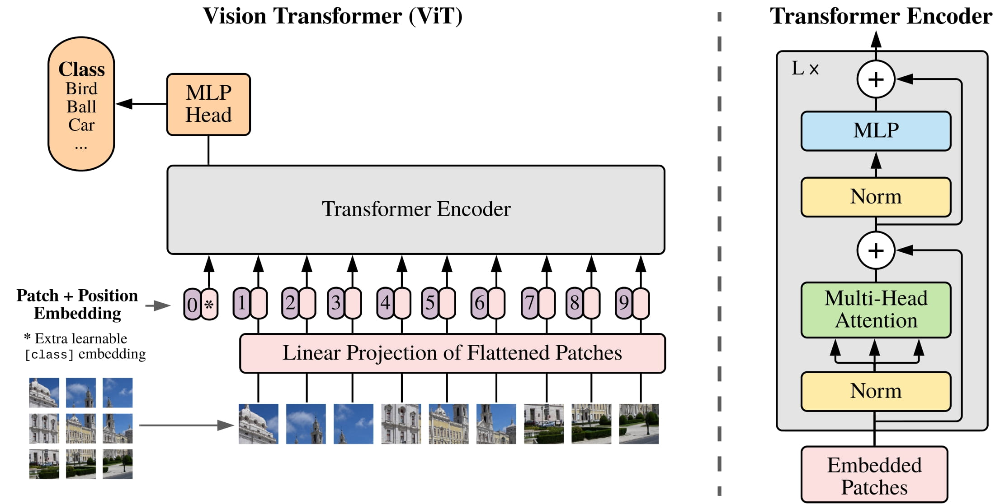


In [35]:
class VisionTransformer:
    """Original ViT architecture"""

    def __init__(self,
                 image: np.ndarray,
                 patch_size: int = 16,
                 number_of_encoders: int = 8,
                 number_of_heads: int = 8,
                 head: Optional[Callable[[np.ndarray], np.ndarray]] = None
                 ):
        """
        Args:
            image: a sample image to derive shapes from
            patch_size: the size of the patch
            number_of_encoders: how many encoders to use
            number_of_heads: how many attention heads to use
            head: what kind of head computation is used
        """
        width, height, nchannels = image.shape  # assumes image in W x H x C
        assert width == height, 'Image should be a square.'
        self.image_dim = width
        self.patch_size = patch_size

        # construct Transformer encoder
        self.n_patches = (self.image_dim // self.patch_size) ** 2
        self.patch_dim = nchannels * self.patch_size ** 2
        assert self.patch_dim % number_of_heads == 0, \
        'Patch dimension should be devisable by number of attention heads'

        self.pos_enc = positional_encoding
        self.encoder_stack = [
            EncoderBlock(self.n_patches,
                         self.patch_dim,
                         number_of_heads)
            for _ in range(number_of_encoders)
            ]

        # construct Transformer head
        if head is not None:
            self.head = head
        else:
            # dummy classification layer
            self.softmax = partial(softmax, axis=-1)
            self.head = partial(linear_layer,
                                output_size=1,
                                activation=self.softmax)

    def create_patches(self, image: np.ndarray) -> np.ndarray:
        patches = []
        for i in range(0, self.image_dim, self.patch_size):
            for j in range(0, self.image_dim, self.patch_size):
                x_offset = i + self.patch_size
                y_offset = j + self.patch_size
                patch = image[i:x_offset, j:y_offset, :]
                patches.append(patch.reshape(-1))

        return np.array(patches)

    def __call__(self, image: np.ndarray) -> np.ndarray:
        emb = self.create_patches(image)  # num_patches x patch_dim
        emb, _ = self.pos_enc(emb, emb.shape[-1])
        for encoder in self.encoder_stack:
            emb = encoder(emb)

        out = self.head(emb)
        return emb, out

In [36]:
# load some sample image
image_url = 'https://bucket.bluegartr.com/ae8016ef54322a69f03ea26e819a27bc.png'

try:
    # Send an HTTP GET request to the URL
    response = requests.get(image_url)

    # Check if the request was successful (status code 200)
    if response.status_code == 200:
        # Read the content of the response and create an image from it
        image_data = BytesIO(response.content)
        image = Image.open(image_data)
        img = np.array(image)[:, :, :3]

        # Optionally, save the image to a local file
        # image.save('downloaded_image.jpg')

    else:
        print("Failed to retrieve the image. Status code:", response.status_code)

except Exception as e:
    print("An error occurred:", str(e))

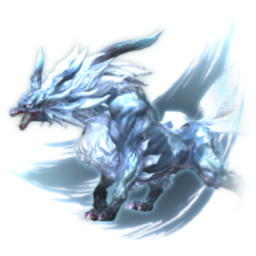

In [37]:
image

In [38]:
vit = VisionTransformer(img)
emb, out = vit(img)
vit.__dict__

{'image_dim': 256,
 'patch_size': 16,
 'n_patches': 256,
 'patch_dim': 768,
 'pos_enc': <function __main__.positional_encoding(x: numpy.ndarray, embedding_size: int) -> list[numpy.ndarray, numpy.ndarray]>,
 'encoder_stack': [<__main__.EncoderBlock at 0x7e9a986b37f0>,
 'softmax': functools.partial(<function softmax at 0x7e9aa33a5d80>, axis=-1),
 'head': functools.partial(<function linear_layer at 0x7e9a986c15a0>, output_size=1, activation=functools.partial(<function softmax at 0x7e9aa33a5d80>, axis=-1))}

In [39]:
px.imshow(emb)

In [40]:
pca = PCA(n_components=3)
reduced = pca.fit_transform(emb)
px.scatter_3d(x=reduced[:, 0], y=reduced[:, 1], z=reduced[:, 2])

In [41]:
tsne = TSNE(n_components=3, perplexity=10, n_iter=300, random_state=0)
reduced = tsne.fit_transform(emb)
px.scatter_3d(x=reduced[:, 0],
              y=reduced[:, 1],
              z=reduced[:, 2])